In [82]:
from histomicstk.saliency.tissue_detection import get_tissue_mask
import cv2
from matplotlib import pylab as plt
from matplotlib.colors import ListedColormap

In [41]:
import numpy as np
vals = np.random.rand(256,3)
vals[0, ...] = [0.9, 0.9, 0.9]
cMap = ListedColormap(1 - vals)

In [22]:
from histomicstk.preprocessing.color_deconvolution import stain_unmixing_routine
from histomicstk.saliency.tissue_detection import get_tissue_mask
import cv2


ref = load_thumbnail("0aff58_0")
labeled, largest = get_tissue_mask(thumbnail_im=ref, deconvolve_first=True, sigma=1.5, min_size=2)
W_est = stain_unmixing_routine(im_rgb=ref, mask_out=labeled == 0)
print(W_est)

[[ 0.1975068   0.03676924  0.97992258]
 [ 0.96369977  0.13691341 -0.19918187]
 [ 0.17964916  0.98990037 -0.00884972]]


In [52]:
from histomicstk.preprocessing.color_deconvolution import rgb_separate_stains_macenko_pca, _reorder_stains

def estimate_stain_vectors(im_rgb, mask_out=None):
    I_0 = np.median(im_rgb, axis=(0, 1))
    W_source = rgb_separate_stains_macenko_pca(im_rgb=im_rgb, I_0=I_0, mask_out=mask_out)
    # W_source = _reorder_stains(W_source, stains=stains)
    return W_source

In [45]:
from histomicstk.preprocessing.color_deconvolution import rgb_separate_stains_macenko_pca, color_deconvolution, _reorder_stains
from histomicstk.saliency.tissue_detection import get_tissue_mask
from histomicstk.preprocessing.color_deconvolution import stain_color_map


# stain_color_map.update(
#     a=W_est[:, 0],
#     b=W_est[:, 1],
# )


def get_mask(im_rgb, W_est = None):
    I_0 = np.median(im_rgb, axis=(0, 1))
    if W_est is None:
        W_est = estimate_stain_vectors(im_rgb=im_rgb)
    Stains, StainsFloat, wc = color_deconvolution(im_rgb, w=W_est, I_0=I_0)
    labeled, largest = get_tissue_mask(
        thumbnail_im=Stains, deconvolve_first=False,
        n_thresholding_steps=1, sigma=2.0, min_size=1)
    return labeled, largest

In [55]:
labeled, largest = get_mask(ref)

In [261]:
from histomicstk.preprocessing.color_normalization.deconvolution_based_normalization import deconvolution_based_normalization
import numpy as np

# TODO: can we estimate the stain matrix and compare it to the precomputed ones available in the matlab code?

def normalize_stain(x):

    I_0 = np.median(x, axis=(0, 1))
    print("I_O:", I_0)

    stain_unmixing_routine_params= {
        "stain_unmixing_method": "macenko_pca",
        "stain_unmixing_params": {"I_0": I_0},
    }

    # get mask
    labeled, _ = get_tissue_mask(
        thumbnail_im=x, deconvolve_first=True,
        n_thresholding_steps=1, sigma=2.0,
        stain_unmixing_routine_kwargs=stain_unmixing_routine_params,
        min_size=1,
    )
    return labeled

    # W_est = stain_unmixing_routine(im_rgb=x, stain_unmixing_params={"I_0": I_0}, mask_out=labeled == 0)

    # normalized = deconvolution_based_normalization(
    #     im_src=x,
    #     W_source=W_est,
    #     W_target=stains["masson_trichrome"],
    #     mask_out=labeled == 0,
    #     stain_unmixing_routine_params=stain_unmixing_routine_params,
    # )
    # return normalized, labeled

labeled = normalize_stain(x)

I_O: [243. 243. 242.]


In [292]:
import cv2

labeled = get_mask(
    x,
    # w_est=stains["masson_trichrome"]
    w_est=w_est,
)
# labeled = normalize_stain(x)
contours, _ = cv2.findContours((labeled != 0).astype(np.uint8), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

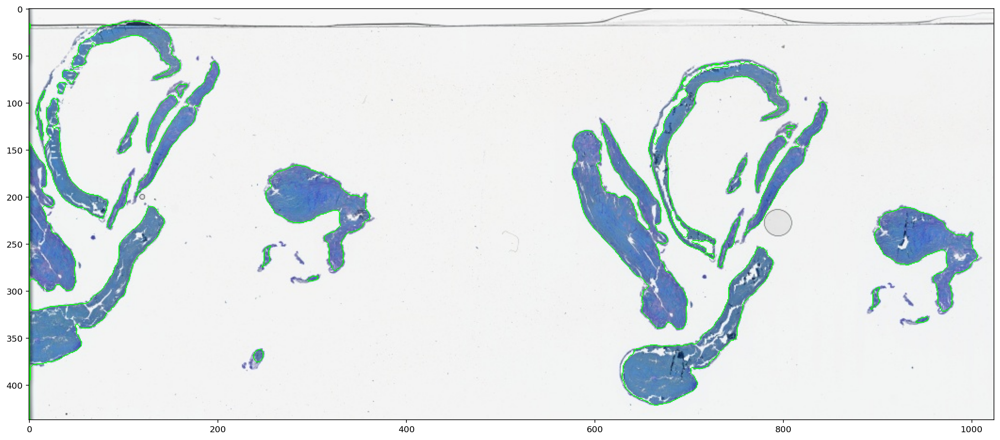

In [293]:
# f, ax = plt.subplots(1, 2, figsize=(20, 20))
# ax[0].imshow(x)
# # ax[1].imshow(normalized)
# ax[1].imshow(labeled != 0, cmap=cMap);

plt.figure(figsize=(20, 20))
plt.imshow(cv2.drawContours(x.copy(), contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=1))

In [24]:
from histomicstk.preprocessing.color_deconvolution import stain_color_map

stain_color_map

{'hematoxylin': [0.65, 0.7, 0.29],
 'eosin': [0.07, 0.99, 0.11],
 'dab': [0.27, 0.57, 0.78],
 'null': [0.0, 0.0, 0.0]}

In [16]:
import json
import numpy as np

with open("stain_vectors.json", "r") as f:
    stains = json.load(f)

stains = {k: np.array(v) for k, v in stains.items()}

stains

{'he1': array([[0.644211, 0.092789, 0.      ],
        [0.716556, 0.954111, 0.      ],
        [0.266844, 0.283111, 0.      ]]),
 'he2': array([[0.49015734, 0.04615336, 0.        ],
        [0.76897085, 0.8420684 , 0.        ],
        [0.41040173, 0.5373925 , 0.        ]]),
 'masson_trichrome': array([[0.7995107 , 0.09997159, 0.        ],
        [0.5913521 , 0.73738605, 0.        ],
        [0.10528667, 0.6680326 , 0.        ]])}

[250. 255. 255.]


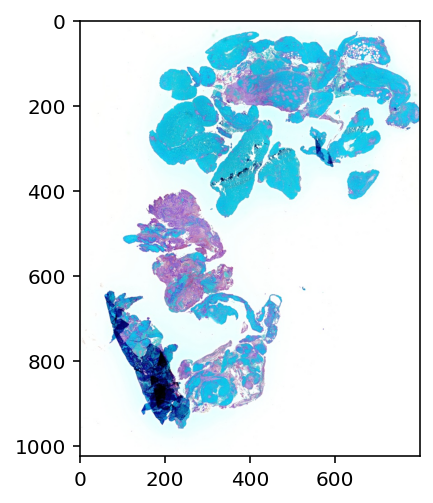

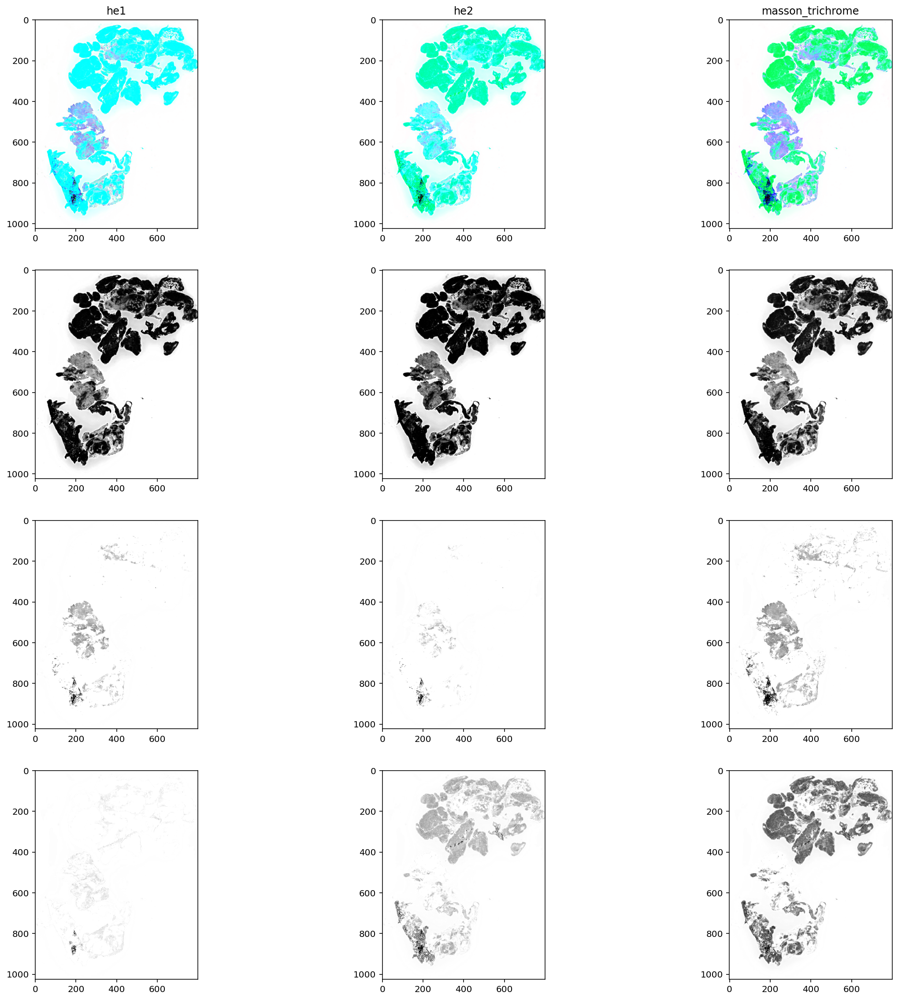

In [142]:
from histomicstk.preprocessing.color_deconvolution import color_deconvolution, complement_stain_matrix
import matplotlib.pyplot as plt

I_0 = np.median(x, axis=(0, 1))

print(I_0)

plt.imshow(x)

f, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 20))

for col, (name, w) in enumerate(stains.items()):
    imDeconvolved = color_deconvolution(im_rgb=x, w=w, I_0=I_0)
    for row in range(4):
        if row == 0:
            axes[row, col].set_title(name)
            axes[row, col].imshow(imDeconvolved.Stains)
        else:
            axes[row, col].imshow(imDeconvolved.Stains[:, :, row-1], cmap="gray")

In [7]:
import cv2
def load_thumbnail(image_id: str):
    x = cv2.imread(f"mayo_clinic_strip_ai/data/train/thumbnails/{image_id}.jpeg", cv2.IMREAD_COLOR)
    cv2.cvtColor(x, cv2.COLOR_BGR2RGB, dst=x)
    return x

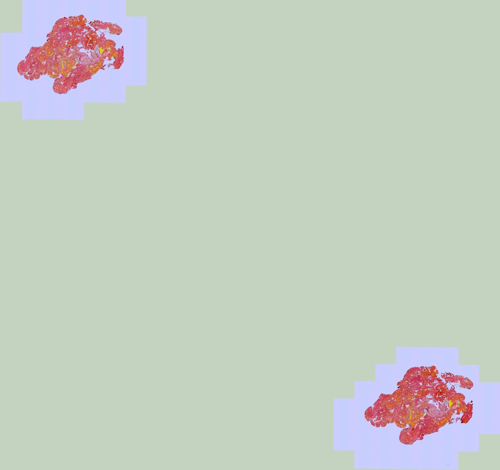

In [74]:
from mayo_clinic_strip_ai.viz import plot
img_rgb = load_thumbnail("0aaeb3_0")
plot(img_rgb, crop=None)

/var/folders/c_/bmfbzq_j43xclmxbbtp_y5p80000gn/T/ipykernel_42702/1755603302.py:10: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  I_0, c = mode(x.reshape(-1, 3), axis=0, nan_policy="omit")
/Users/Jake/Projects/kaggle/venv/lib/python3.9/site-packages/histomicstk/preprocessing/color_conversion/rgb_to_sda.py:48: RuntimeWarning: divide by zero encountered in log
  im_sda = -np.log(im_rgb/(1.*I_0)) * 255/np.log(I_0)


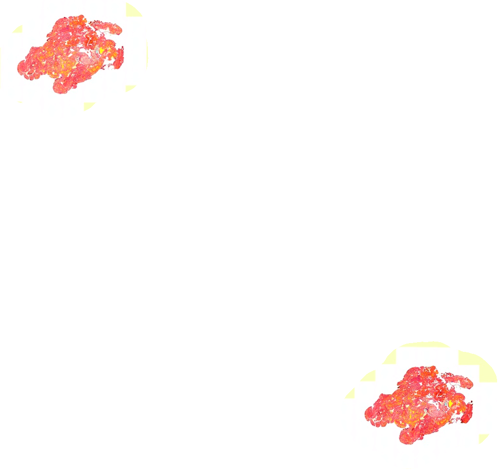

In [81]:

import numpy as np

import cv2




def normalize_background(img_rgb, mask_out = None):
    x = img_rgb.copy().astype(np.float16)
    if mask_out is not None:
        x[mask_out] = np.nan
    I_0, c = mode(x.reshape(-1, 3), axis=0, nan_policy="omit")
    I_0 = I_0.squeeze().astype(np.uint8)
    





tissue_mask, _ = get_tissue_mask(img_rgb, sigma=1)
contour_mask = contour_border_mask(tissue_mask, thickness=100)
normed = normalize_background(img_rgb, mask_out=np.logical_not(contour_mask))
normed[np.logical_not(np.logical_or(tissue_mask, contour_mask))] = (255, 255, 255)
plot(normed, crop=None)

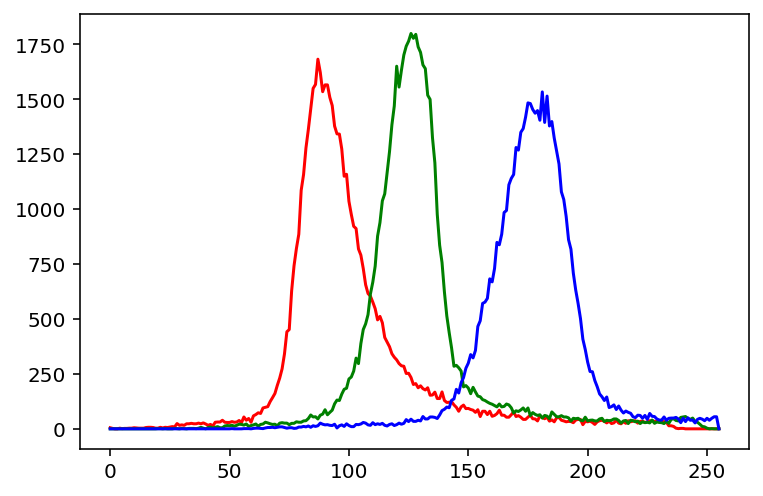

In [27]:
import cv2
import matplotlib.pyplot as plt

def plot_hist(img, mask=None):
    for i, col in enumerate(["r", "g", "b"]):
        histr = cv2.calcHist(images=[img], channels=[i], mask=mask.astype(np.uint8), histSize=[256], ranges=[0, 255])
        plt.plot(histr,color = col)

x = load_thumbnail("fbdcde_1")
labeled, largest = get_tissue_mask(thumbnail_im=x, deconvolve_first=True, n_thresholding_steps=1, sigma=1.5, min_size=2)
plot_hist(x, mask=labeled > 0)

In [1]:
import pandas as pd

df = pd.read_csv("mayo_clinic_strip_ai/data/train.csv")
df

,image_id,center_id,patient_id,image_num,label
0,006388_0,11,006388,0,CE
1,008e5c_0,11,008e5c,0,CE
2,00c058_0,11,00c058,0,LAA
3,01adc5_0,11,01adc5,0,LAA
4,026c97_0,4,026c97,0,CE
...,...,...,...,...,...
749,fe9645_0,3,fe9645,0,CE
750,fe9bec_0,4,fe9bec,0,LAA
751,ff14e0_0,6,ff14e0,0,CE
752,ffec5c_0,7,ffec5c,0,LAA


/var/folders/c_/bmfbzq_j43xclmxbbtp_y5p80000gn/T/ipykernel_42702/1755603302.py:10: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  I_0, c = mode(x.reshape(-1, 3), axis=0, nan_policy="omit")
/Users/Jake/Projects/kaggle/venv/lib/python3.9/site-packages/histomicstk/preprocessing/color_conversion/rgb_to_sda.py:48: RuntimeWarning: divide by zero encountered in log
  im_sda = -np.log(im_rgb/(1.*I_0)) * 255/np.log(I_0)


ValueError: zero-size array to reduction operation minimum which has no identity

<Figure size 432x288 with 0 Axes>

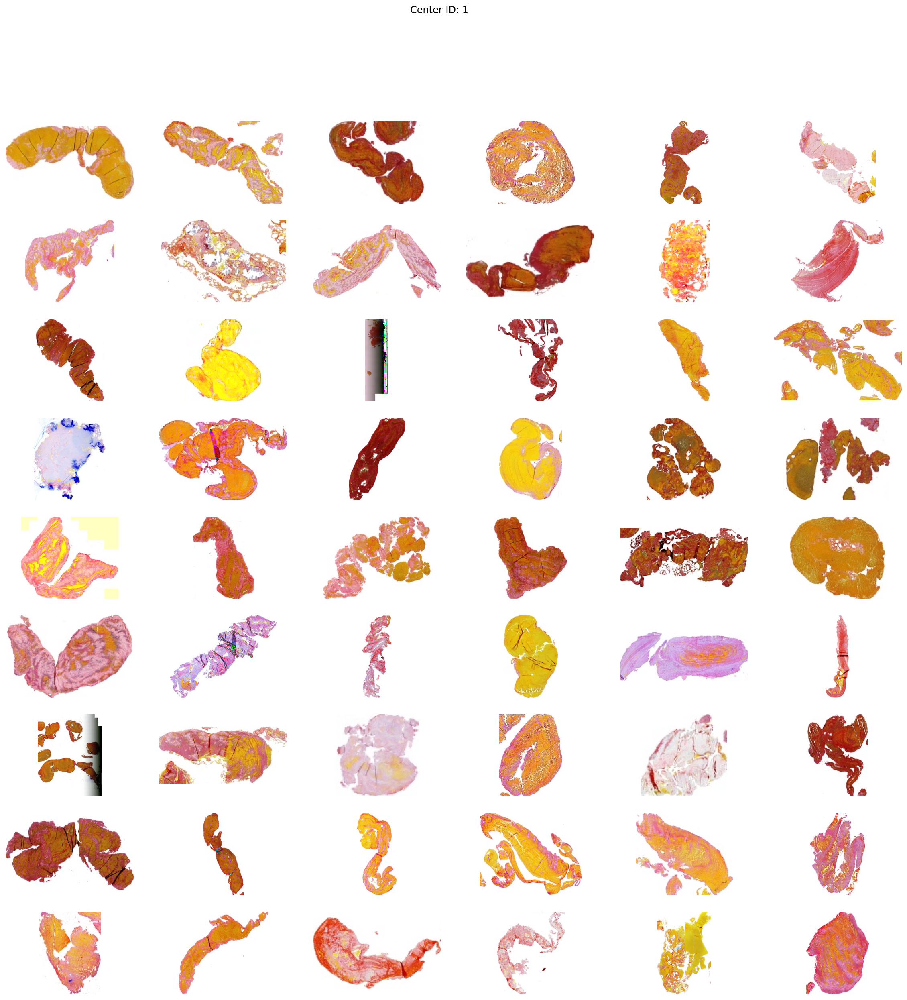

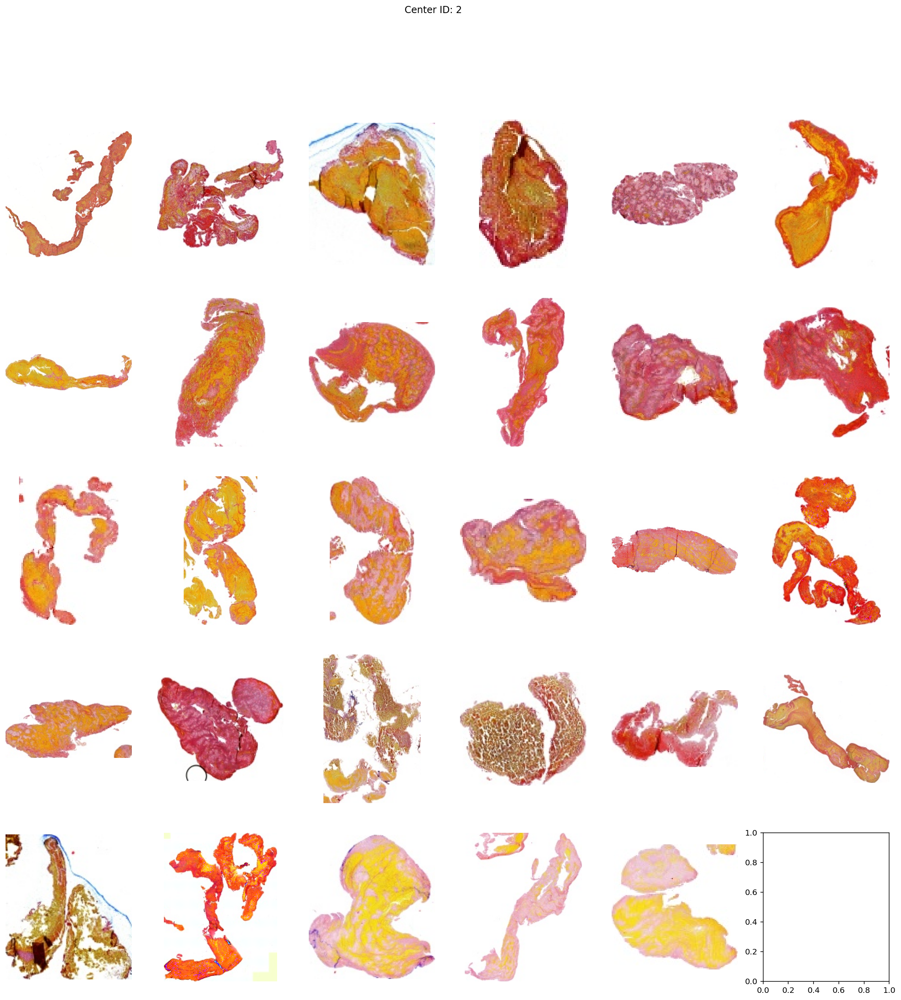

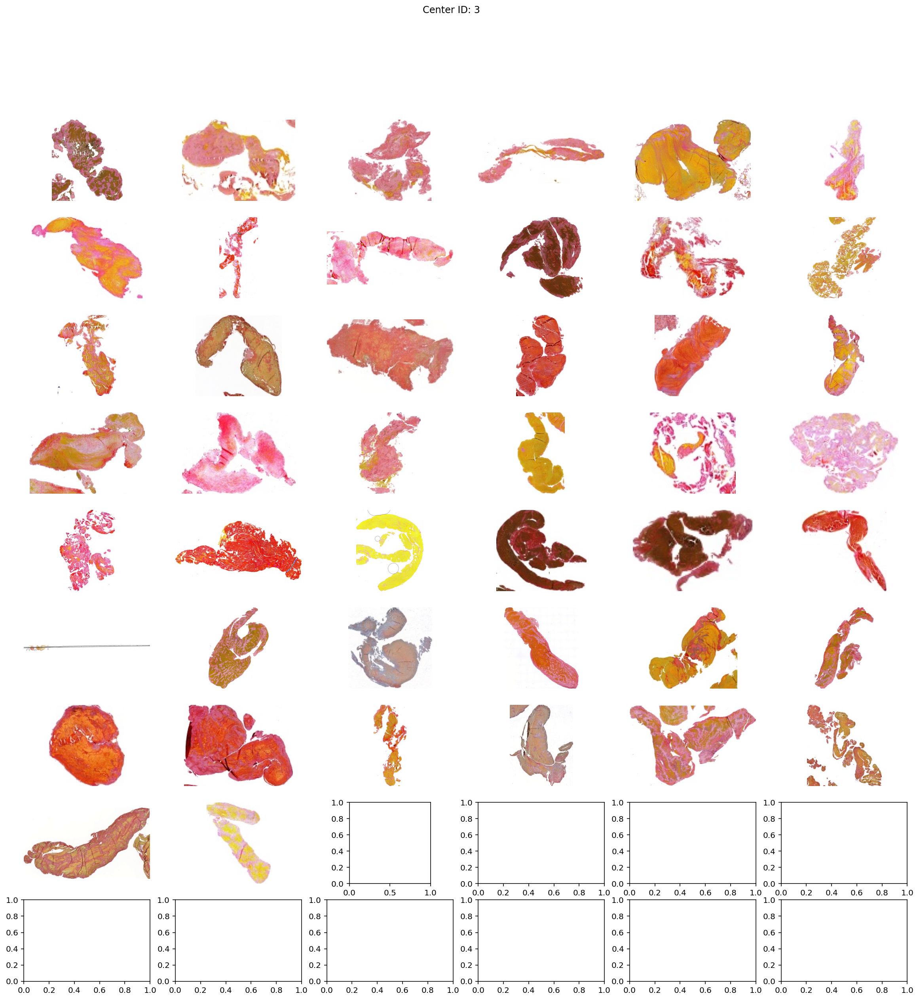

In [83]:
import matplotlib.pyplot as plt
from math import ceil
from histomicstk.preprocessing.color_normalization.deconvolution_based_normalization import deconvolution_based_normalization
from histomicstk.saliency.tissue_detection import get_tissue_mask
import numpy as np
from histomicstk.preprocessing.color_deconvolution import stain_color_map

# stain_color_map.update(
#     a=stains["masson_trichrome"][:, 0].tolist(),
#     b=stains["masson_trichrome"][:, 1].tolist(),
# )

plt.tight_layout()
for center_id, center_df in df.groupby("center_id")["image_id"]:
    n = len(center_df)
    f, axes = plt.subplots(nrows=ceil(n / 6), ncols=6, figsize=(20, 20))
    f.suptitle(f"Center ID: {center_id}")
    for img_id, a in zip(center_df.tolist(), axes.flatten()):
        img_rgb = load_thumbnail(img_id)
        if img_rgb.shape[0] > img_rgb.shape[1]:
            img_rgb = img_rgb.transpose(1, 0, 2)
        tissue_mask, largest = get_tissue_mask(thumbnail_im=img_rgb, deconvolve_first=False, n_thresholding_steps=1, sigma=1.5)

        contour_mask = contour_border_mask(tissue_mask, thickness=100)
        normed = normalize_background(img_rgb, mask_out=np.logical_not(contour_mask))

        # labeled, largest = get_mask(im_rgb=img_rgb)
        # img_rgb = deconvolution_based_normalization(im_src=img_rgb, mask_out=labeled == 0, W_target=W_est, stains=["a", "b"])
        x, y, w, h = cv2.boundingRect(largest.astype(np.uint8))
        crop = normed[y:y+h, x:x+w, :]
        # crop = normalize_background(crop, mask_out=labeled[y:y+h, x:x+w]>0)
        a.imshow(crop)
        a.axis("off")